In [3]:
pip install tensorflow-io

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.6/49.6 MB 12.4 MB/s eta 0:00:00


In [6]:
import numpy as np
import tensorflow as tf
import keras
from keras import layers
import cv2
import os
from google.colab import drive
import imghdr
import matplotlib.pyplot as plt
from PIL import Image as PILImage
import tensorflow_io as tfio

In [7]:
drive.mount('/content/drive', force_remount = True)


Mounted at /content/drive


In [8]:
#Function to process Data and load it into
dirpath = '/content/drive/My Drive/Flood/archive'
maskpath = dirpath + '/Mask'
imagepath = dirpath + '/Image'


filetypes = ['JPEG', 'PNG']

def check_files(directory, allowed_formats=['jpeg', 'png']):
    valid_files = []
    invalid_files = []

    for root, dirs, files in os.walk(directory):
        for file in files:
            file_path = os.path.join(root, file)
            with PILImage.open(file_path) as img:
                if img.format.lower() in allowed_formats:
                    valid_files.append(file_path)
                else:
                    if img.format == 'WEBP':
                        new_file_path = os.path.splitext(file_path)[0] + "_converted.jpeg"
                        im = PILImage.open(file_path).convert('RGB')
                        im.save(new_file_path, "jpeg")
                        valid_files.append(new_file_path)
                    invalid_files.append((file_path, f"Bad format: {img.format}"))



    return valid_files, invalid_files


v, inv = check_files(imagepath)

In [9]:
#Creating and Combining Dataset
import tensorflow_datasets as tfds

datasetMask = tf.data.Dataset.list_files(maskpath + '/*')
datasetImage = tf.data.Dataset.list_files(imagepath + '/*')


datasetMask = sorted(datasetMask.as_numpy_iterator())
datasetImage = sorted(datasetImage.as_numpy_iterator())


sdatasetMask = tf.data.Dataset.from_tensor_slices(datasetMask)
sdatasetImage = tf.data.Dataset.from_tensor_slices(datasetImage)


combDataset = tf.data.Dataset.zip((sdatasetImage, sdatasetMask))

for i in combDataset.take(1):
    print(i)

(<tf.Tensor: shape=(), dtype=string, numpy=b'/content/drive/My Drive/Flood/archive/Image/1.jpg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'/content/drive/My Drive/Flood/archive/Mask/1.png'>)


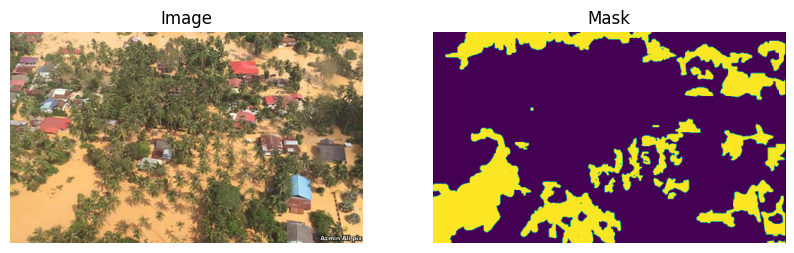

In [10]:
#Map function

def mapfunc(i, m):
    istring, mstring = tf.io.read_file(i), tf.io.read_file(m)
    img = tf.image.decode_image(istring, channels=3)
    mas = tf.image.decode_image(mstring, channels=1)

    return img, mas


mappeddata = combDataset.map(mapfunc)

for img, mask in mappeddata.take(1):
    img_array = img.numpy()
    mask_array = mask.numpy()

    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.title('Image')
    plt.imshow(img_array)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title('Mask')
    plt.imshow(mask_array)
    plt.axis('off')

    plt.show()







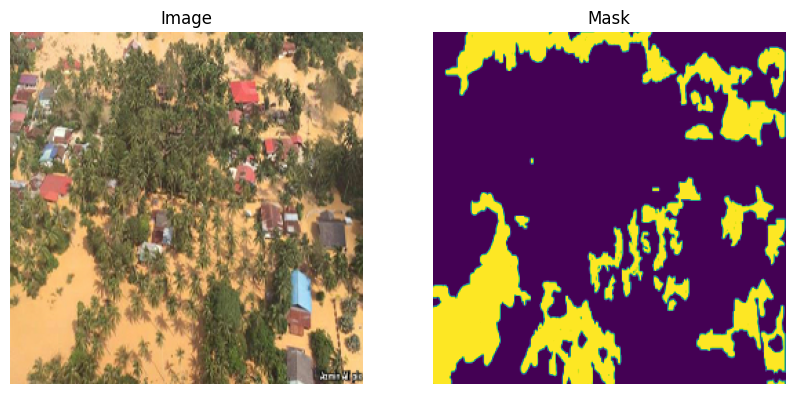

In [11]:


def resizingf(img, mask):
    img = tf.ensure_shape(img, [None, None, 3])
    mask = tf.ensure_shape(mask, [None, None, 1])

    res_img = tf.image.resize(img, [256, 256])
    res_mask = tf.image.resize(mask, [256, 256])


    res_img = tf.ensure_shape(res_img, [256, 256, 3])
    res_mask = tf.ensure_shape(res_mask, [256, 256, 1])

    return res_img, res_mask




resDataset = mappeddata.map(resizingf)


for img, mask in resDataset.take(1):
    img_array = img.numpy()
    mask_array = mask.numpy()


    img_array = (img_array - np.min(img_array)) / (np.max(img_array) - np.min(img_array))

    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.title('Image')
    plt.imshow(img_array)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title('Mask')
    plt.imshow(mask_array)
    plt.axis('off')

    plt.show()




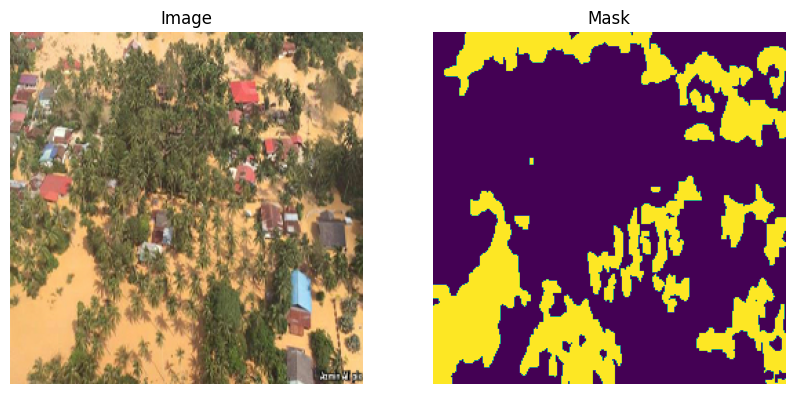

In [12]:
#Normalizing the images

def normalize(img, mask):
  img = img / 255.0
  mask = tf.where(mask > 0, 1, 0)

  return img, mask


finaldataset = resDataset.map(normalize)

for img, mask in finaldataset.take(1):
    img_array = img.numpy()
    mask_array = mask.numpy()


    img_array = (img_array - np.min(img_array)) / (np.max(img_array) - np.min(img_array))

    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.title('Image')
    plt.imshow(img_array)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title('Mask')
    plt.imshow(mask_array)
    plt.axis('off')

    plt.show()




In [13]:
from sklearn.model_selection import train_test_split


data_size = tf.data.experimental.cardinality(finaldataset).numpy()

#Split into sets and batch for functional api
train_num = int(data_size * .8)
cv_num = int(data_size * .1)
test_num = data_size - cv_num - train_num

finaldataset = finaldataset.shuffle(data_size)

train = finaldataset.take(train_num)
tempcv = finaldataset.skip(train_num)
cv = tempcv.take(cv_num)
test = tempcv.skip(cv_num)

#checks
print(tf.data.experimental.cardinality(train).numpy())
print(tf.data.experimental.cardinality(cv).numpy())
print(tf.data.experimental.cardinality(test).numpy())


#Batching for func

trainbatch = train.batch(32)
cvbatch = cv.batch(32)
testbatch = test.batch(32)

'''
for img_batch, mask_batch in trainbatch.take(1):  # Take only the first batch
    # Iterate through each image and mask in the batch
    for img, mask in zip(img_batch, mask_batch):
        img_array = img.numpy()
        mask_array = mask.numpy()

        # Normalize the image array for display
        plt.figure(figsize=(10, 5))

        plt.subplot(1, 2, 1)
        plt.title('Image')
        plt.imshow(img_array)
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.title('Mask')
        plt.imshow(mask_array, cmap='gray')
        plt.axis('off')

        plt.show()
'''



231
28
30


"\nfor img_batch, mask_batch in trainbatch.take(1):  # Take only the first batch\n    # Iterate through each image and mask in the batch\n    for img, mask in zip(img_batch, mask_batch):\n        img_array = img.numpy()\n        mask_array = mask.numpy()\n\n        # Normalize the image array for display\n        plt.figure(figsize=(10, 5))\n\n        plt.subplot(1, 2, 1)\n        plt.title('Image')\n        plt.imshow(img_array)\n        plt.axis('off')\n\n        plt.subplot(1, 2, 2)\n        plt.title('Mask')\n        plt.imshow(mask_array, cmap='gray')\n        plt.axis('off')\n\n        plt.show()\n"

In [19]:
#Model Creation
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, UpSampling2D, Input, Concatenate

In [20]:
def custom_dice_loss(true, pred):
  y_pred = tf.keras.backend.flatten(pred)
  y_true = tf.keras.backend.flatten(true)

  # Binary masks, so when we multiply them, it results the numnber of postive(ie 1) shared pixels

  inter = tf.reduce_sum(y_pred * y_true)
  sum_pred = tf.reduce_sum(y_pred)
  sum_true = tf.reduce_sum(y_true)

  loss = (2.0 * inter + tf.keras.backend.epsilon()) / (sum_true + sum_pred + tf.keras.backend.epsilon())

  return 1 - loss


In [21]:
def unet(input_size):
  input = Input(input_size)
  #DownSampling
  conv1a = Conv2D(32, (3,3), 1, activation = 'relu', padding = 'same')(input)
  conv1b = Conv2D(32, (3,3), 1, activation = 'relu', padding = 'same')(conv1a)
  pool1 = MaxPooling2D(pool_size = (2,2), strides = (2, 2))(conv1b)

  conv2a = Conv2D(64, (3,3), 1, activation = 'relu', padding = 'same')(pool1)
  conv2b = Conv2D(64, (3,3), 1, activation = 'relu', padding = 'same')(conv2a)
  pool2 = MaxPooling2D(pool_size = (2,2), strides = (2, 2))(conv2b)

  conv3a = Conv2D(128, (3,3), 1, activation = 'relu', padding = 'same')(pool2)
  conv3b = Conv2D(128, (3,3), 1, activation = 'relu', padding = 'same')(conv3a)
  pool3 = MaxPooling2D(pool_size = (2,2), strides = (2, 2))(conv3b)

  conv4a = Conv2D(256, (3,3), 1, activation = 'relu', padding = 'same')(pool3)
  conv4b = Conv2D(256, (3,3), 1, activation = 'relu', padding = 'same')(conv4a)
  pool4 = MaxPooling2D(pool_size = (2,2), strides = (2, 2))(conv4b)

  #Bottleneck Layer
  convBot1 = Conv2D(512, (3,3), 1, activation = 'relu', padding = 'same')(pool4)
  convBot2 = Conv2D(512, (3,3), 1, activation = 'relu', padding = 'same')(convBot1)

  #Up Sampling

  up1 = UpSampling2D((2,2), interpolation = 'nearest')(convBot2)
  concan1 = Concatenate()([up1, conv4b])
  convUp1a = Conv2D(256, (3,3), 1, activation = 'relu', padding = 'same')(concan1)
  convUp1b = Conv2D(256, (3,3), 1, activation = 'relu', padding = 'same')(convUp1a)

  up2 = UpSampling2D((2,2), interpolation = 'nearest')(convUp1b)
  concan2 = Concatenate()([up2, conv3b])
  convUp2a = Conv2D(128, (3,3), 1, activation = 'relu', padding = 'same')(concan2)
  convUp2b = Conv2D(128, (3,3), 1, activation = 'relu', padding = 'same')(convUp2a)

  up3 = UpSampling2D((2,2), interpolation = 'nearest')(convUp2b)
  concan3 = Concatenate()([up3, conv2b])
  convUp3a = Conv2D(64, (3,3), 1, activation = 'relu', padding = 'same')(concan3)
  convUp3b = Conv2D(64, (3,3), 1, activation = 'relu', padding = 'same')(convUp3a)

  up4 = UpSampling2D((2,2), interpolation = 'nearest')(convUp3b)
  concan4 = Concatenate()([up4, conv1b])
  convUp4a = Conv2D(32, (3,3), 1, activation = 'relu', padding = 'same')(concan4)
  convUp4b = Conv2D(32, (3,3), 1, activation = 'relu', padding = 'same')(convUp4a)

  #Final 1x1 conv block to segment into black and white mask class
  res = Conv2D(1, (1, 1), 1, activation = 'sigmoid')(convUp4b)

  model = tf.keras.Model(inputs = input, outputs = res)

  return model

In [22]:
input = (256, 256, 3)
model = unet(input)

model.compile(
    optimizer = tf.keras.optimizers.Adam(learning_rate =1e-4),
    loss= 'binary_crossentropy',
    metrics = ['accuracy']
)

model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 256, 256, 32)   │            896 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 256, 256, 32)   │          9,248 │ conv2d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 128, 128, 32)   │              0 │ conv2d_1[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 128, 128, 64)   │         18,496 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 128, 128, 64)   │         36,928 │ conv2d_2[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 64, 64, 64)     │              0 │ conv2d_3[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 64, 64, 128)    │         73,856 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 64, 64, 128)    │        147,584 │ conv2d_4[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_2           │ (None, 32, 32, 128)    │              0 │ conv2d_5[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, 32, 32, 256)    │        295,168 │ max_pooling2d_2[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_7 (Conv2D)         │ (None, 32, 32, 256)    │        590,080 │ conv2d_6[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_3           │ (None, 16, 16, 256)    │              0 │ conv2d_7[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_8 (Conv2D)         │ (None, 16, 16, 512)    │      1,180,160 │ max_pooling2d_3[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_9 (Conv2D)         │ (None, 16, 16, 512)    │      2,359,808 │ conv2d_8[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ up_sampling2d             │ (None, 32, 32, 512)    │              0 │ conv2d_9[0][0]         │
│ (UpSampling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 32, 32, 768)    │              0 │ up_sampling2d[0][0],   │
│                      

 Total params: 7,846,657 (29.93 MB)

 Trainable params: 7,846,657 (29.93 MB)

 Non-trainable params: 0 (0.00 B)

In [14]:
hist = model.fit(trainbatch, epochs = 50, validation_data = cvbatch)

Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 119s 7s/step - accuracy: 0.6146 - loss: 0.6917 - val_accuracy: 0.6693 - val_loss: 0.6860
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 17s 1s/step - accuracy: 0.6441 - loss: 0.6826 - val_accuracy: 0.6361 - val_loss: 0.6471
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 16s 1s/step - accuracy: 0.6200 - loss: 0.6387 - val_accuracy: 0.7610 - val_loss: 0.5438
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 19s 1s/step - accuracy: 0.7364 - loss: 0.5820 - val_accuracy: 0.7622 - val_loss: 0.5532
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step - accuracy: 0.7760 - loss: 0.5311 - val_accuracy: 0.7563 - val_loss: 0.5735
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 16s 1s/step - accuracy: 0.7729 - loss: 0.5219 - val_accuracy: 0.7760 - val_loss: 0.5036
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 16s 1s/step - accuracy: 0.7996 - loss: 0.4664 - val_accuracy: 0.7986 - val_loss: 0.4733
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 19s 1s/step - accuracy: 0.8032 - loss: 0.4596 - val_accuracy: 0.7683 - val_loss: 0.4835
Epoch 9

In [25]:
import pickle
'''
with open('/content/drive/My Drive/Flood/unet_model3_history.pkl', 'wb') as file:
    pickle.dump(hist.history, file)
'''

"\nwith open('/content/drive/My Drive/Flood/unet_model3_history.pkl', 'wb') as file:\n    pickle.dump(hist.history, file)\n"

In [23]:
from tensorflow.keras.models import load_model

#model.save('/content/drive/My Drive/Flood/unet_model3.keras')


vals = load_model('/content/drive/My Drive/Flood/unet_model3.keras')

In [26]:
with open('/content/drive/My Drive/Flood/unet_model3_history.pkl', 'rb') as file:
    hist = pickle.load(file)

In [28]:
def plot_data(history_dict):
    train_accuracy = history_dict.get('accuracy', [])
    val_accuracy = history_dict.get('val_accuracy', [])


    epochs = range(1, len(train_accuracy) + 1)


    plt.plot(epochs, train_accuracy, label='Train')
    plt.plot(epochs, val_accuracy, label='Validation')
    plt.title('Training vs Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

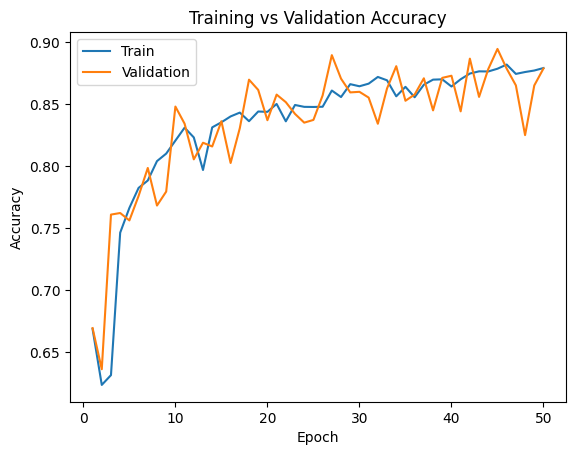

In [29]:
plot_data(hist)

In [31]:
cpred = vals.predict(cvbatch)

1/1 ━━━━━━━━━━━━━━━━━━━━ 27s 27s/step


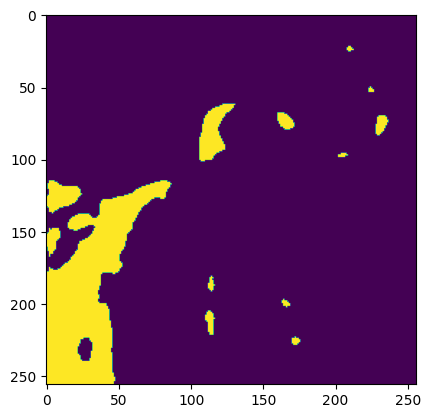

In [32]:
out = (cpred > 0.5)
plt.imshow(out[0])

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


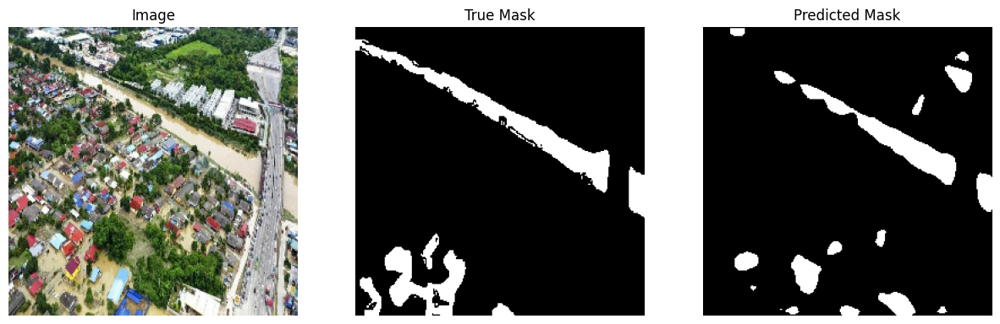

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


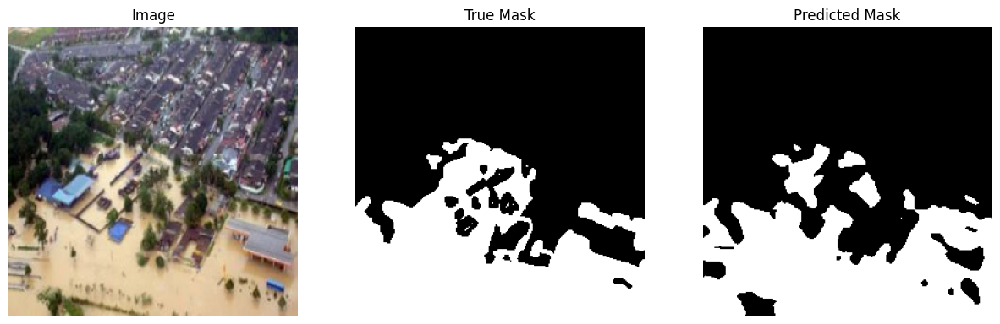

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 655ms/step


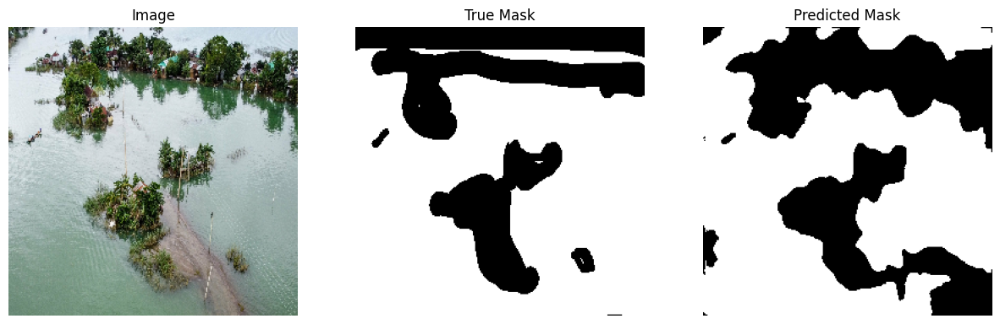

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 656ms/step


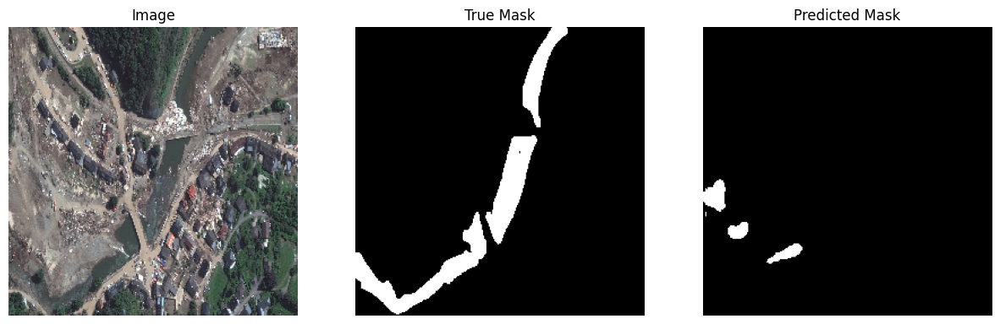

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 676ms/step


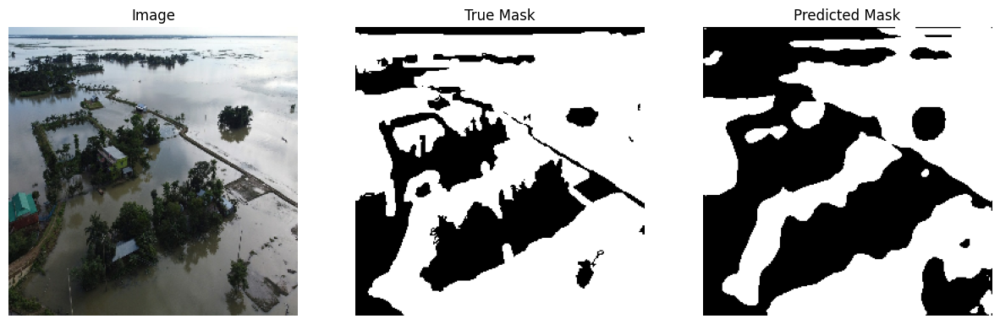

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 655ms/step


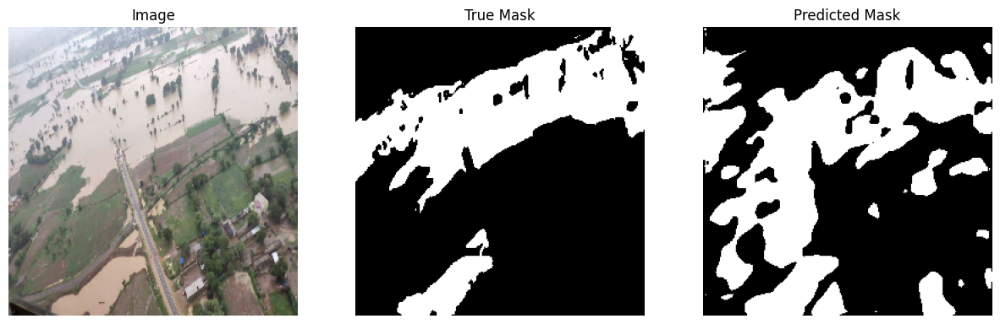

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 651ms/step


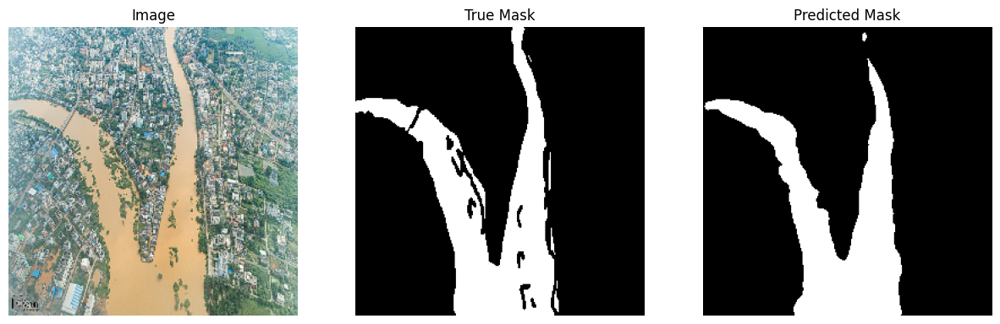

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 665ms/step


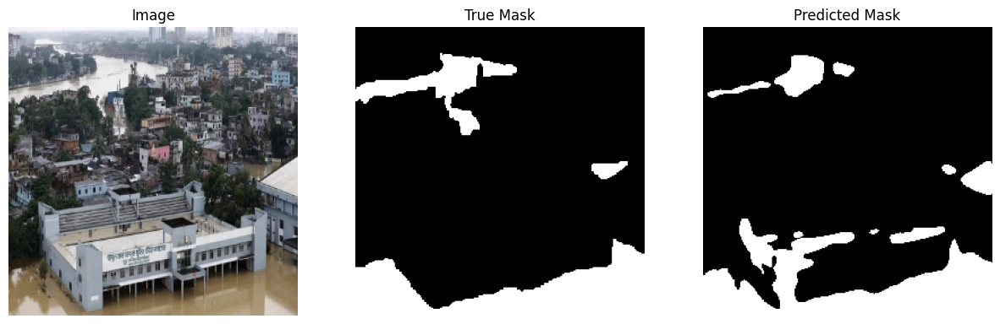

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 672ms/step


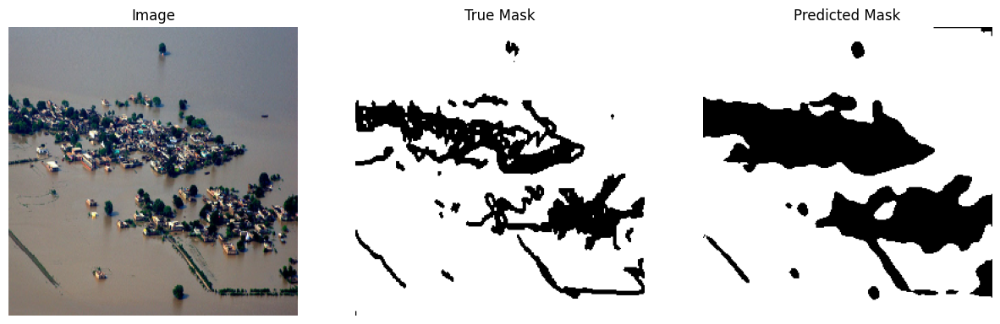

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 657ms/step


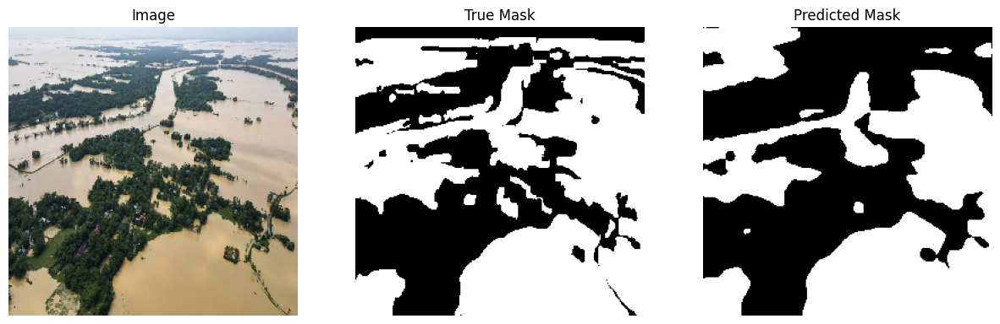

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 659ms/step


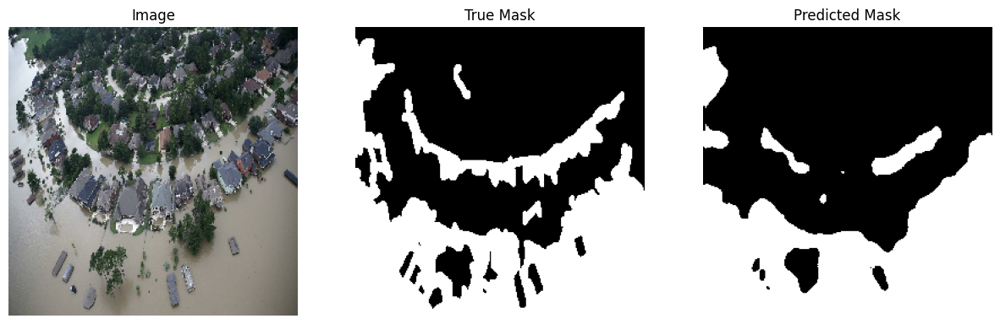

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


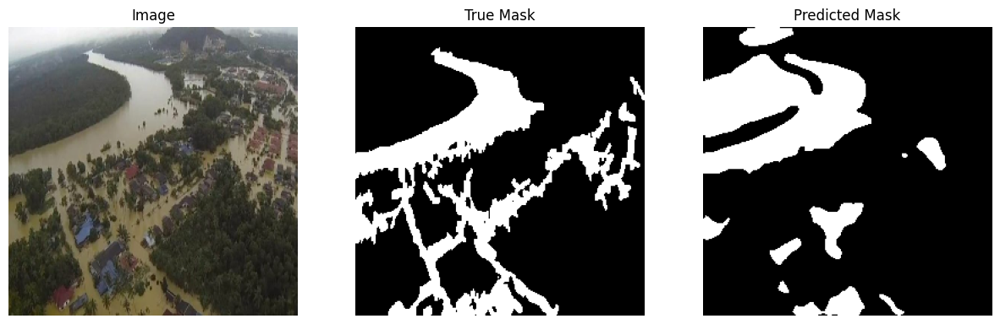

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


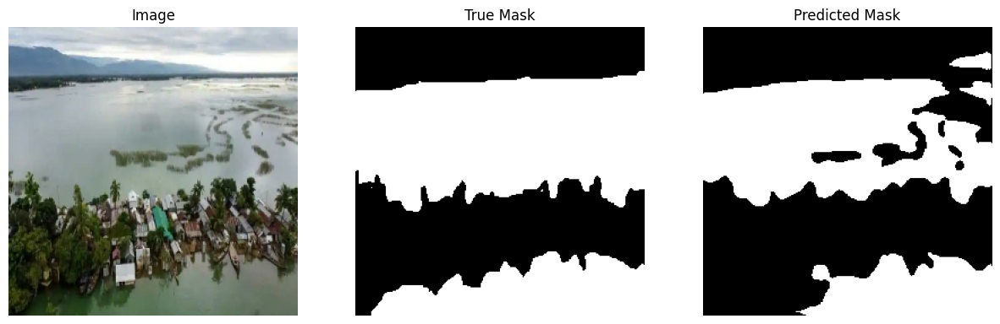

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


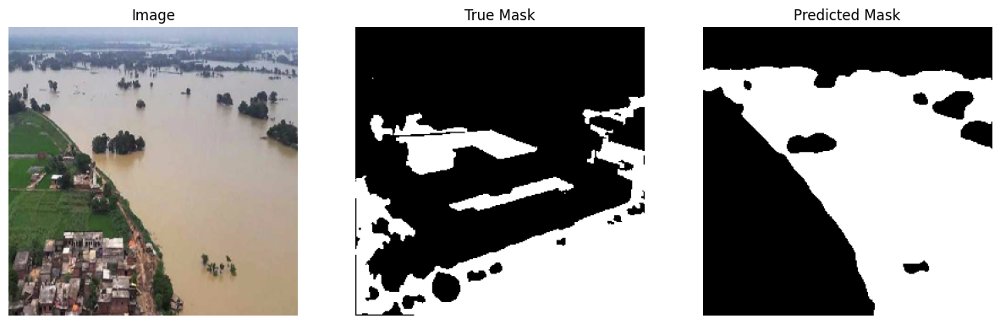

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 680ms/step


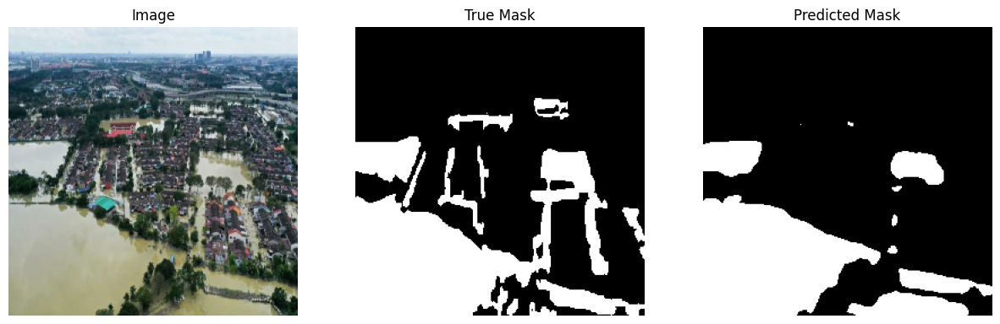

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 698ms/step


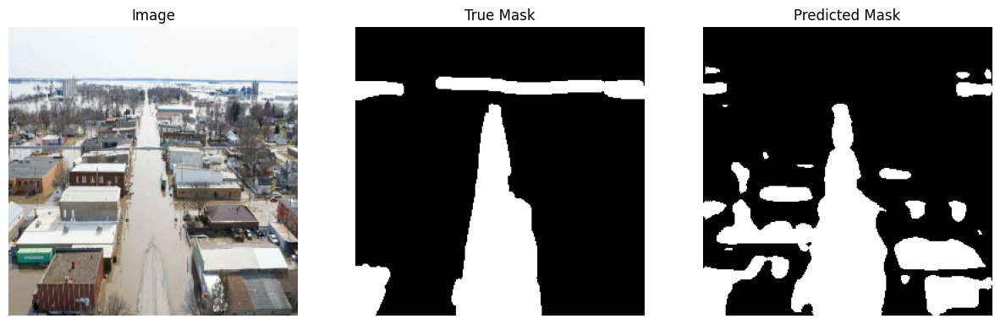

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 672ms/step


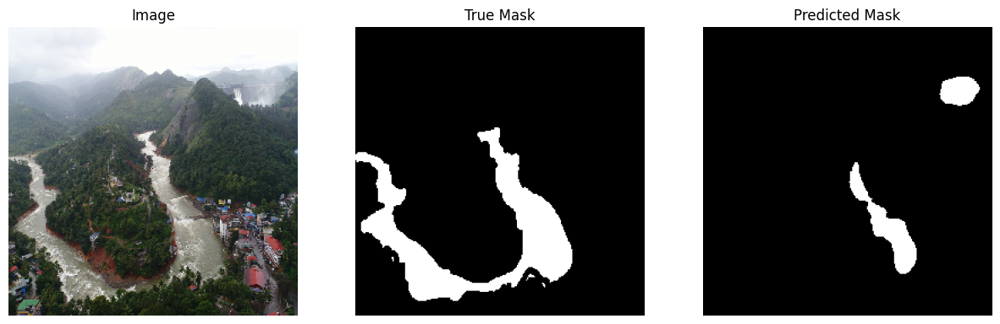

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 662ms/step


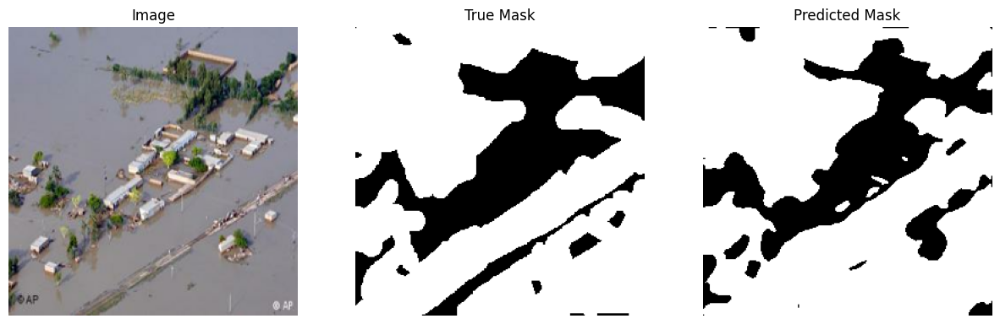

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 674ms/step


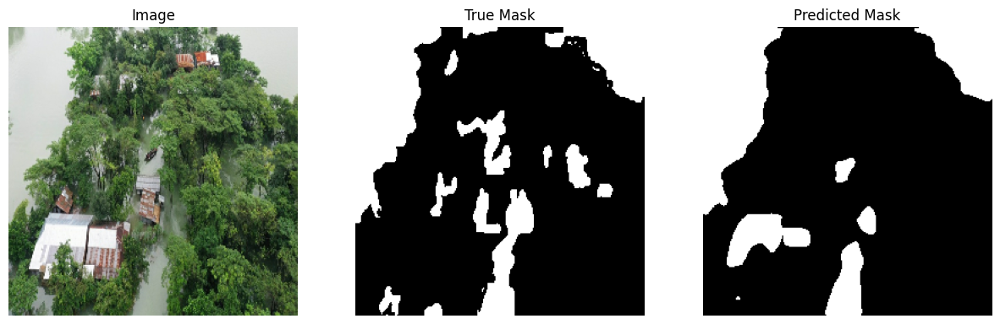

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 688ms/step


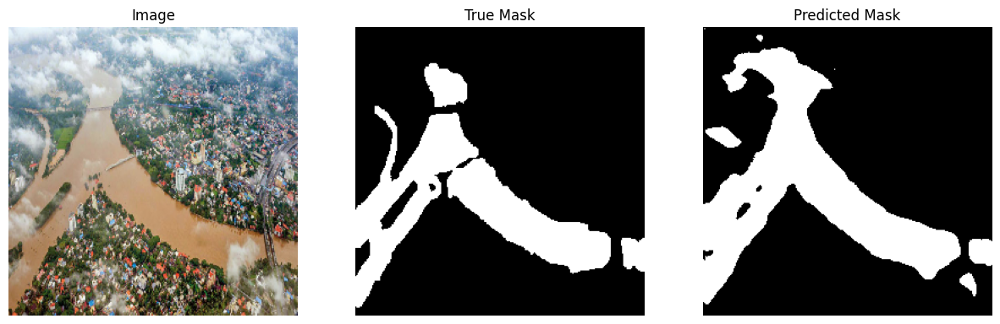

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 717ms/step


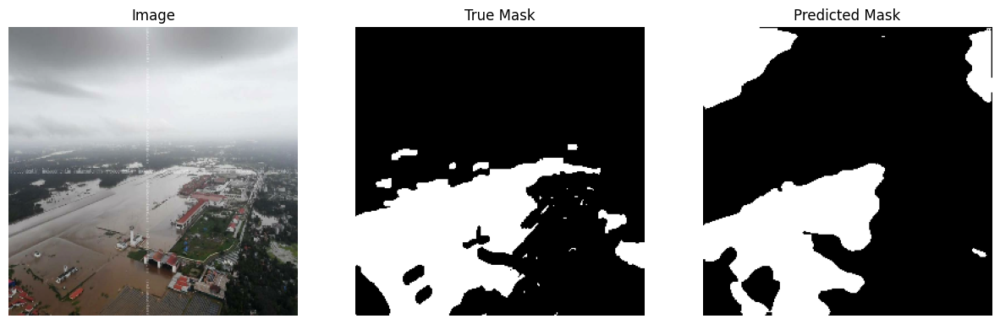

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 685ms/step


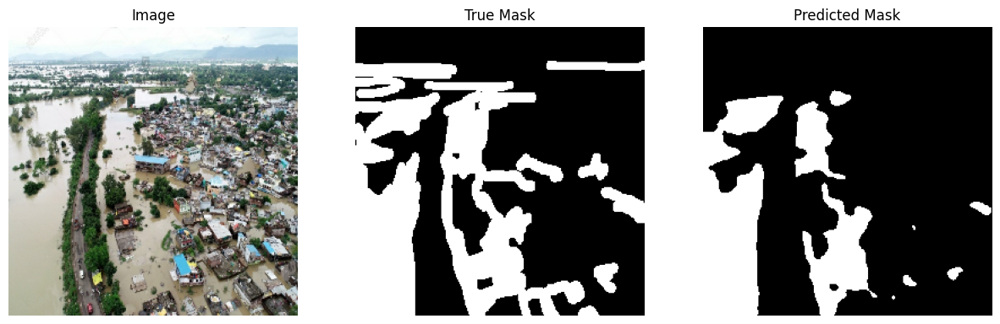

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


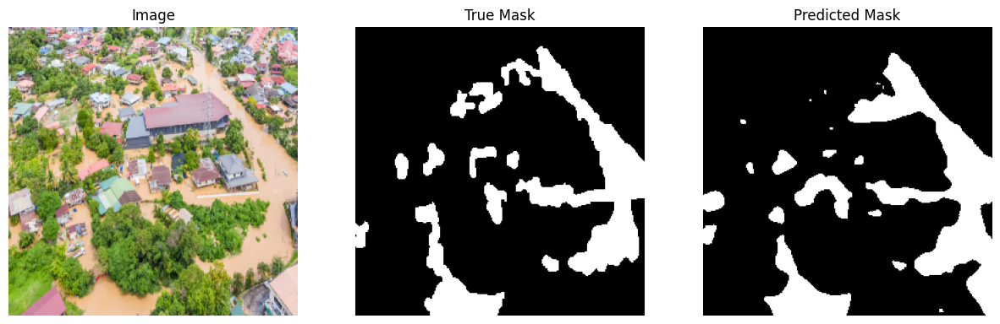

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


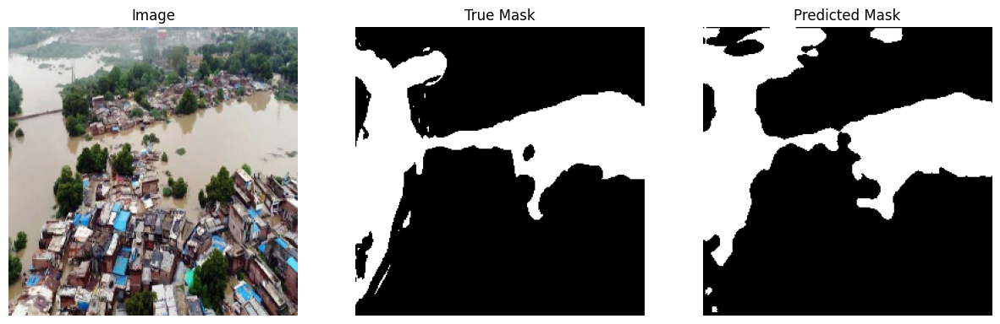

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


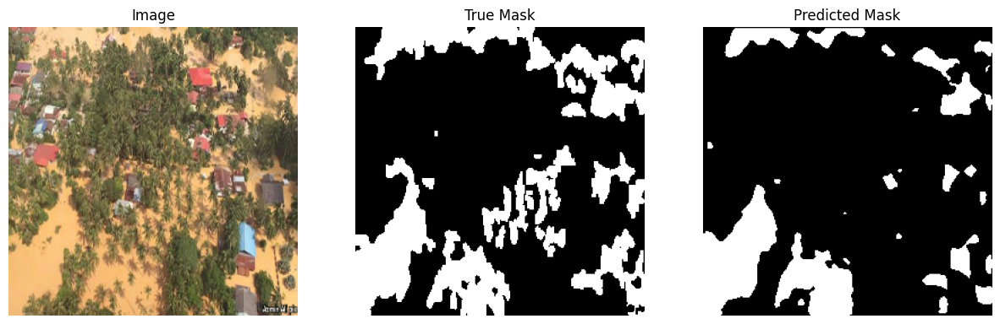

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 830ms/step


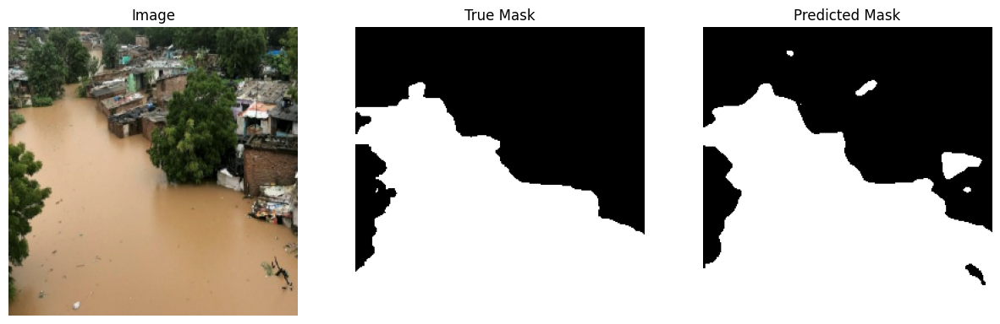

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 692ms/step


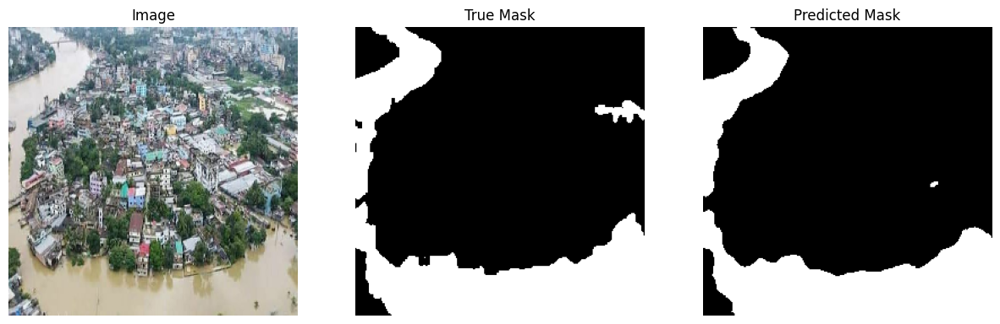

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 709ms/step


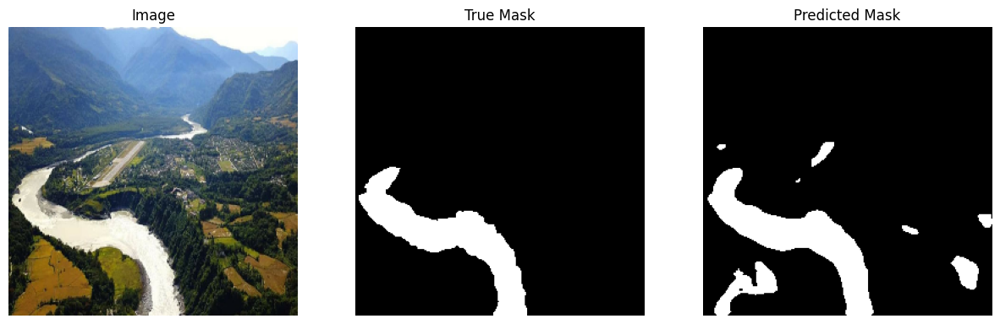

In [34]:
for img_batch, mask_batch in cvbatch.take(1):
    for img, mask in zip(img_batch, mask_batch):
        img_array = img.numpy()
        mask_array = mask.numpy()

        # Normalize
        img_array = (img_array - np.min(img_array)) / (np.max(img_array) - np.min(img_array))


        pred_mask = vals.predict(np.expand_dims(img_array, axis=0))[0]
        pred_mask = (pred_mask > 0.5).astype(np.uint8)

        plt.figure(figsize=(15, 5))

        plt.subplot(1, 3, 1)
        plt.title('Image')
        plt.imshow(img_array)
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.title('True Mask')
        plt.imshow(mask_array, cmap='gray')
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.title('Predicted Mask')
        plt.imshow(pred_mask, cmap='gray')
        plt.axis('off')

        plt.show()

In [35]:
cv_loss, cv_accuract = vals.evaluate(cvbatch)
test_loss, test_accuracy = vals.evaluate(testbatch)


1/1 ━━━━━━━━━━━━━━━━━━━━ 34s 34s/step - accuracy: 0.9002 - loss: 0.2499
1/1 ━━━━━━━━━━━━━━━━━━━━ 29s 29s/step - accuracy: 0.8940 - loss: 0.2580
